In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# !pip install tensorflow==2.14.0
!pip install tensorflow-addons==0.22.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.3/612.3 kB 7.4 MB/s eta 0:00:00


In [3]:
import os, random, json, PIL, shutil, re, imageio, glob
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import ImageDraw
import matplotlib.pyplot as plt
# from kaggle_datasets import KaggleDatasets
import tensorflow as tf
import tensorflow.keras.layers as L
import tensorflow.keras.backend as K
import tensorflow_addons as tfa
from tensorflow.keras import Model, losses, optimizers
from tensorflow.keras.callbacks import Callback

random.seed(9)
np.random.seed(9)
tf.random.set_seed(9)
os.environ['PYTHONHASHSEED'] = str(9)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.15.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're u

In [4]:
# import tensorflow as tf
# print("done")
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print(f'Running on TPU {tpu.master()}')
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()


REPLICAS = strategy.num_replicas_in_sync
AUTO = tf.data.experimental.AUTOTUNE
print(f'REPLICAS: {REPLICAS}')

tpu_devices = tf.config.list_logical_devices('TPU')
for device in tpu_devices:
    print(device.name)

Running on TPU 


REPLICAS: 8
/device:TPU:0
/device:TPU:1
/device:TPU:2
/device:TPU:3
/device:TPU:4
/device:TPU:5
/device:TPU:6
/device:TPU:7


In [5]:
HEIGHT = 256
WIDTH = 256
HEIGHT_RESIZE = 128
WIDTH_RESIZE = 128
CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 30
TRANSFORMER_BLOCKS = 6
GENERATOR_LR = 5e-5
DISCRIMINATOR_LR = 5e-5
LAMBDA = 0.1

In [6]:
MONET_FILENAMES = tf.io.gfile.glob(str('/content/monet_tfrec/monet*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str('/content/photo_tfrec/photo*.tfrec'))

def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)

print(f'Monet TFRecord files: {len(MONET_FILENAMES)}')
print(f'Monet image files: {n_monet_samples}')
print(f'Photo TFRecord files: {len(PHOTO_FILENAMES)}')
print(f'Photo image files: {n_photo_samples}')

Monet TFRecord files: 5
Monet image files: 300
Photo TFRecord files: 20
Photo image files: 7038


In [7]:
def data_augment(image):
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    # 90º rotations
    if p_rotate > .8:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .6:
        image = tf.image.rot90(image, k=2) # rotate 180º
    elif p_rotate > .4:
        image = tf.image.rot90(image, k=1) # rotate 90º

    # Flips
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    if p_spatial > .75:
        image = tf.image.transpose(image)

    # Train on crops
    image = tf.image.random_crop(image, size=[HEIGHT_RESIZE, WIDTH_RESIZE, CHANNELS])

    return image

In [8]:
def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=CHANNELS)
    image = tf.reshape(image, [HEIGHT, WIDTH, CHANNELS])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        'image':      tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTO)
    return dataset

def get_dataset(filenames, augment=None, repeat=True, shuffle=True, batch_size=1):
    dataset = load_dataset(filenames)

    if augment:
        dataset = dataset.map(augment, num_parallel_calls=AUTO)
    dataset = dataset.map(normalize_img, num_parallel_calls=AUTO)
    if repeat:
        dataset = dataset.repeat()
    if shuffle:
        dataset = dataset.shuffle(512)

    dataset = dataset.batch(batch_size)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)

    return dataset

def display_samples(ds, n_samples):
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        example_sample = next(ds_iter)
        plt.subplot(121)
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

def display_generated_samples(ds, model, n_samples):
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        example_sample = next(ds_iter)
        generated_sample = model.predict(example_sample)

        f = plt.figure(figsize=(12, 12))

        plt.subplot(121)
        plt.title('Input image')
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')

        plt.subplot(122)
        plt.title('Generated image')
        plt.imshow(generated_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

def evaluate_cycle(ds, generator_a, generator_b, n_samples=1):
    fig, axes = plt.subplots(n_samples, 3, figsize=(22, (n_samples*6)))
    axes = axes.flatten()

    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        idx = n_sample*3
        example_sample = next(ds_iter)
        generated_a_sample = generator_a.predict(example_sample)
        generated_b_sample = generator_b.predict(generated_a_sample)

        axes[idx].set_title('Input image', fontsize=18)
        axes[idx].imshow(example_sample[0] * 0.5 + 0.5)
        axes[idx].axis('off')

        axes[idx+1].set_title('Generated image', fontsize=18)
        axes[idx+1].imshow(generated_a_sample[0] * 0.5 + 0.5)
        axes[idx+1].axis('off')

        axes[idx+2].set_title('Cycled image', fontsize=18)
        axes[idx+2].imshow(generated_b_sample[0] * 0.5 + 0.5)
        axes[idx+2].axis('off')

    plt.show()

def predict_and_save(input_ds, generator_model, output_path):
    i = 1
    for img in input_ds:
        prediction = generator_model(img, training=False)[0].numpy() # make predition
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)   # re-scale
        im = PIL.Image.fromarray(prediction)
        im.save(f'{output_path}{str(i)}.jpg')
        print("saved image ", i)
        i += 1

In [9]:
conv_initializer = tf.random_normal_initializer(mean=0.0, stddev=0.02)
gamma_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

def encoder_block(input_layer, filters, size=3, strides=2, apply_instancenorm=True, activation=L.ReLU(), name='block_x'):
    block = L.Conv2D(filters, size,
                     strides=strides,
                     padding='same',
                     use_bias=False,
                     kernel_initializer=conv_initializer,
                     name=f'encoder_{name}')(input_layer)

    if apply_instancenorm:
        block = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(block)

    block = activation(block)

    return block

def transformer_block(input_layer, size=3, strides=1, name='block_x'):
    filters = input_layer.shape[-1]

    block = L.Conv2D(filters, size, strides=strides, padding='same', use_bias=False,
                     kernel_initializer=conv_initializer, name=f'transformer_{name}_1')(input_layer)
    block = L.ReLU()(block)

    block = L.Conv2D(filters, size, strides=strides, padding='same', use_bias=False,
                     kernel_initializer=conv_initializer, name=f'transformer_{name}_2')(block)
    block = L.Add()([block, input_layer])

    return block

def decoder_block(input_layer, filters, size=3, strides=2, apply_instancenorm=True, name='block_x'):
    block = L.Conv2DTranspose(filters, size,
                              strides=strides,
                              padding='same',
                              use_bias=False,
                              kernel_initializer=conv_initializer,
                              name=f'decoder_{name}')(input_layer)

    if apply_instancenorm:
        block = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(block)

    block = L.ReLU()(block)

    return block

# def decoder_rc_block(input_layer, filters, size=3, strides=1, apply_instancenorm=True, name='block_x'):
#     block = tf.image.resize(images=input_layer, method='bilinear',
#                             size=(input_layer.shape[1]*2, input_layer.shape[2]*2))
#     block = L.Conv2D(filters, size,
#                      strides=strides,
#                      padding='same',
#                      use_bias=False,
#                      kernel_initializer=conv_initializer,
#                      name=f'decoder_{name}')(block)

#     if apply_instancenorm:
#         block = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(block)

#     block = L.ReLU()(block)

#     return block

In [10]:
def generator(height=HEIGHT, width=WIDTH, channels=CHANNELS, transformer_blocks=TRANSFORMER_BLOCKS):
    OUTPUT_CHANNELS = 3
    inputs = L.Input(shape=[height, width, channels], name='input_image')

    enc_1 = encoder_block(inputs, 64,  7, 1, apply_instancenorm=False, activation=L.ReLU(), name='block_1')
    enc_2 = encoder_block(enc_1, 128, 3, 2, apply_instancenorm=True, activation=L.ReLU(), name='block_2')
    enc_3 = encoder_block(enc_2, 256, 3, 2, apply_instancenorm=True, activation=L.ReLU(), name='block_3')

    x = enc_3
    for n in range(transformer_blocks):
        x = transformer_block(x, 3, 1, name=f'block_{n+1}')

    x_skip = L.Concatenate(name='enc_dec_skip_1')([x, enc_3])
    dec_1 = decoder_block(x_skip, 128, 3, 2, apply_instancenorm=True, name='block_1')
    x_skip = L.Concatenate(name='enc_dec_skip_2')([dec_1, enc_2])
    dec_2 = decoder_block(x_skip, 64,  3, 2, apply_instancenorm=True, name='block_2')
    x_skip = L.Concatenate(name='enc_dec_skip_3')([dec_2, enc_1])

    outputs = last = L.Conv2D(OUTPUT_CHANNELS, 7,
                              strides=1, padding='same',
                              kernel_initializer=conv_initializer,
                              use_bias=False,
                              activation='tanh',
                              name='decoder_output_block')(x_skip)

    generator = Model(inputs, outputs)
    return generator

sample_generator = generator()
sample_generator.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 encoder_block_1 (Conv2D)    (None, 256, 256, 64)         9408      ['input_image[0][0]']         
                                                                                                  
 re_lu_1 (ReLU)              (None, 256, 256, 64)         0         ['encoder_block_1[0][0]']     
                                                                                                  
 encoder_block_2 (Conv2D)    (None, 128, 128, 128)        73728     ['re_lu_1[0][0]']             
                                                                                              

In [11]:
def discriminator_fn(height=HEIGHT, width=WIDTH, channels=CHANNELS):
    inputs = L.Input(shape=[height, width, channels], name='input_image')
    x = encoder_block(inputs, 64,  4, 2, apply_instancenorm=False, activation=L.LeakyReLU(0.2), name='block_1')
    x = encoder_block(x, 128, 4, 2, apply_instancenorm=True, activation=L.LeakyReLU(0.2), name='block_2')
    x = encoder_block(x, 256, 4, 2, apply_instancenorm=True, activation=L.LeakyReLU(0.2), name='block_3')
    x = encoder_block(x, 512, 4, 1, apply_instancenorm=True, activation=L.LeakyReLU(0.2), name='block_4')

    outputs = L.Conv2D(1, 4, strides=1, padding='valid', kernel_initializer=conv_initializer)(x)
    discriminator = Model(inputs, outputs)
    return discriminator

sample_discriminator = discriminator_fn()
sample_discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 encoder_block_1 (Conv2D)    (None, 128, 128, 64)      3072      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 encoder_block_2 (Conv2D)    (None, 64, 64, 128)       131072    
                                                                 
 instance_normalization_4 (  (None, 64, 64, 128)       256       
 InstanceNormalization)                                          
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                           

In [12]:
with strategy.scope():
    monet_generator = generator(height=None, width=None, transformer_blocks=TRANSFORMER_BLOCKS)
    photo_generator = generator(height=None, width=None, transformer_blocks=TRANSFORMER_BLOCKS)
    monet_discriminator = discriminator_fn(height=None, width=None)
    photo_discriminator = discriminator_fn(height=None, width=None)

class CycleGan(Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle

    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_monet, real_photo = batch_data

        with tf.GradientTape(persistent=True) as tape:
            fake_monet = self.m_gen(real_photo, training=True)  # photo - monet - photo
            cycled_photo = self.p_gen(fake_monet, training=True)

            fake_photo = self.p_gen(real_monet, training=True)  # monet - photo - monet
            cycled_monet = self.m_gen(fake_photo, training=True)

            same_monet = self.m_gen(real_monet, training=True)  # generating same images
            same_photo = self.p_gen(real_photo, training=True)

            disc_real_monet = self.m_disc(real_monet, training=True)  # real image checks
            disc_real_photo = self.p_disc(real_photo, training=True)

            disc_fake_monet = self.m_disc(fake_monet, training=True)  # generated image checks
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)      # standard generator losses
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # net generator losses
            total_monet_gen_loss = monet_gen_loss + LAMBDA*total_cycle_loss + 0.5*LAMBDA*self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + LAMBDA*total_cycle_loss + 0.5*LAMBDA*self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)
            # total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            # total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)


            # disc losses
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # calculate gradients
        monet_generator_gradients = tape.gradient(total_monet_gen_loss, self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss, self.p_gen.trainable_variables)
        monet_discriminator_gradients = tape.gradient(monet_disc_loss, self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss, self.p_disc.trainable_variables)

        # update model
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients, self.m_gen.trainable_variables))
        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients, self.p_gen.trainable_variables))
        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients, self.m_disc.trainable_variables))
        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients, self.p_disc.trainable_variables))

        return {'monet_gen_loss': total_monet_gen_loss,'photo_gen_loss': total_photo_gen_loss,'monet_disc_loss': monet_disc_loss,'photo_disc_loss': photo_disc_loss}

In [13]:
with strategy.scope():
    # Discriminator loss {0: fake, 1: real}
    def discriminator_loss(real, generated):
        real_loss = losses.MSE(tf.ones_like(real), real)
        generated_loss = losses.MSE(tf.zeros_like(generated), generated)
        # real_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(real), real)
        # generated_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

    # Generator loss
    def generator_loss(generated):
        return losses.MSE(tf.ones_like(generated), generated)
        # return losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(generated), generated)

    # Cycle consistency loss
    with strategy.scope():
        def calc_cycle_loss(real_image, cycled_image, LAMBDA):
            loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
            return LAMBDA * loss1

    # Identity loss
    with strategy.scope():
        def identity_loss(real_image, same_image, LAMBDA):
            loss = tf.reduce_mean(tf.abs(real_image - same_image))
            return LAMBDA * 0.5 * loss

30 total epochs and 439 steps per epoch
Learning rate schedule: 0.0002 to 0.0002 to 1.52e-06


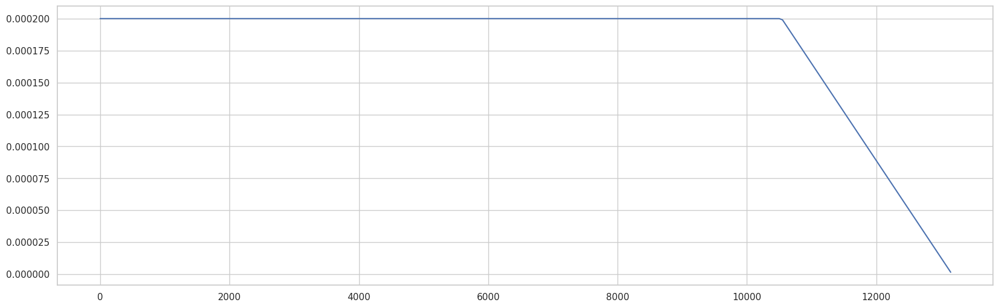

In [14]:
@tf.function
def linear_schedule_with_warmup(step):
    """ Create a schedule with a learning rate that decreases linearly after
    linearly increasing during a warmup period.
    """
    lr_start   = 2e-4
    lr_max     = 2e-4
    lr_min     = 0.

    steps_per_epoch = int(max(n_monet_samples, n_photo_samples)//BATCH_SIZE)
    total_steps = EPOCHS * steps_per_epoch
    warmup_steps = 1
    hold_max_steps = total_steps * 0.8

    if step < warmup_steps:
        lr = (lr_max - lr_start) / warmup_steps * step + lr_start
    elif step < warmup_steps + hold_max_steps:
        lr = lr_max
    else:
        lr = lr_max * ((total_steps - step) / (total_steps - warmup_steps - hold_max_steps))
        if lr_min is not None:
            lr = tf.math.maximum(lr_min, lr)

    return lr

steps_per_epoch = int(max(n_monet_samples, n_photo_samples)//BATCH_SIZE)
total_steps = EPOCHS * steps_per_epoch
rng = [i for i in range(0, total_steps, 50)]
y = [linear_schedule_with_warmup(x) for x in rng]

sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(20, 6))
plt.plot(rng, y)
print(f'{EPOCHS} total epochs and {steps_per_epoch} steps per epoch')
print(f'Learning rate schedule: {y[0]:.3g} to {max(y):.3g} to {y[-1]:.3g}')

In [15]:
with strategy.scope():
    # Create generators
    # Create optimizers
    monet_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=GENERATOR_LR, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=GENERATOR_LR, beta_1=0.5)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=DISCRIMINATOR_LR, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=DISCRIMINATOR_LR, beta_1=0.5)

    #GAN
    gan_model = CycleGan(monet_generator, photo_generator,
                         monet_discriminator, photo_discriminator)

    gan_model.compile(m_gen_optimizer=monet_generator_optimizer,
                      p_gen_optimizer=photo_generator_optimizer,
                      m_disc_optimizer=monet_discriminator_optimizer,
                      p_disc_optimizer=photo_discriminator_optimizer,
                      gen_loss_fn=generator_loss,
                      disc_loss_fn=discriminator_loss,
                      cycle_loss_fn=calc_cycle_loss,
                      identity_loss_fn=identity_loss)

In [16]:
#dataset
monet_ds = get_dataset(MONET_FILENAMES, augment=data_augment, batch_size=BATCH_SIZE)
photo_ds = get_dataset(PHOTO_FILENAMES, augment=data_augment, batch_size=BATCH_SIZE)
gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))

photo_ds_eval = get_dataset(PHOTO_FILENAMES, repeat=False, shuffle=False, batch_size=1)
monet_ds_eval = get_dataset(MONET_FILENAMES, repeat=False, shuffle=False, batch_size=1)

class GANMonitor(Callback):
    def __init__(self, num_img=1, monet_path='monet_track', photo_path='photo_track'):
        self.num_img = num_img
        self.monet_path = monet_path
        self.photo_path = photo_path
        if not os.path.exists(self.monet_path):
            os.makedirs(self.monet_path)
        if not os.path.exists(self.photo_path):
            os.makedirs(self.photo_path)

    def on_epoch_end(self, epoch, logs=None):
        # generated monets
        for i, img in enumerate(photo_ds_eval.take(self.num_img)):
            prediction = monet_generator(img, training=False)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            prediction = PIL.Image.fromarray(prediction)
            prediction.save(f'{self.monet_path}/generated_{i}_{epoch+1}.png')

        # generated photos
        for i, img in enumerate(monet_ds_eval.take(self.num_img)):
            prediction = photo_generator(img, training=False)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            prediction = PIL.Image.fromarray(prediction)
            prediction.save(f'{self.photo_path}/generated_{i}_{epoch+1}.png')

In [17]:
history = gan_model.fit(gan_ds,
                        epochs=EPOCHS,
                        callbacks=[GANMonitor()],
                        steps_per_epoch=(max(n_monet_samples, n_photo_samples)//BATCH_SIZE),
                        verbose=2).history

Epoch 1/30
439/439 - 184s - monet_gen_loss: 0.4956 - photo_gen_loss: 0.5520 - monet_disc_loss: 0.2638 - photo_disc_loss: 0.2562 - 184s/epoch - 420ms/step
Epoch 2/30
439/439 - 59s - monet_gen_loss: 0.4985 - photo_gen_loss: 0.4805 - monet_disc_loss: 0.2219 - photo_disc_loss: 0.2415 - 59s/epoch - 135ms/step
Epoch 3/30
439/439 - 59s - monet_gen_loss: 0.4593 - photo_gen_loss: 0.4966 - monet_disc_loss: 0.2255 - photo_disc_loss: 0.2311 - 59s/epoch - 135ms/step
Epoch 4/30
439/439 - 59s - monet_gen_loss: 0.3908 - photo_gen_loss: 0.4617 - monet_disc_loss: 0.2863 - photo_disc_loss: 0.3042 - 59s/epoch - 135ms/step
Epoch 5/30
439/439 - 59s - monet_gen_loss: 0.4314 - photo_gen_loss: 0.4769 - monet_disc_loss: 0.2249 - photo_disc_loss: 0.2086 - 59s/epoch - 135ms/step
Epoch 6/30
439/439 - 59s - monet_gen_loss: 0.4498 - photo_gen_loss: 0.4827 - monet_disc_loss: 0.2593 - photo_disc_loss: 0.2571 - 59s/epoch - 135ms/step
Epoch 7/30
439/439 - 59s - monet_gen_loss: 0.4340 - photo_gen_loss: 0.3931 - monet_dis

In [18]:
monet_gen_loss = np.mean(history['monet_gen_loss'], axis=(1,2,3))
monet_disc_loss = np.mean(history['monet_disc_loss'], axis=(1,2,3))
photo_gen_loss = np.mean(history['photo_gen_loss'], axis=(1,2,3))
photo_disc_loss = np.mean(history['photo_disc_loss'], axis=(1,2,3))

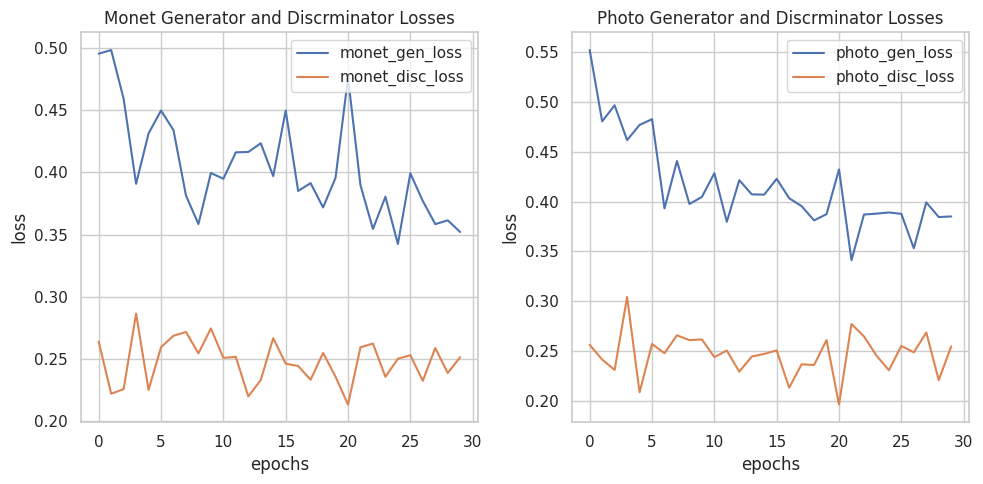

In [19]:
# Create a figure and axis for the first plot
plt.figure(figsize=(10, 5))

# Plot arr1 and arr2 together
plt.subplot(1, 2, 1)  # Create a subplot with 1 row, 2 columns, 1st plot
plt.plot(monet_gen_loss, label='monet_gen_loss')
plt.plot(monet_disc_loss, label='monet_disc_loss')
plt.title("Monet Generator and Discrminator Losses")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.grid(True)

# Plot arr3 and arr4 together
plt.subplot(1, 2, 2)  # Create a subplot with 1 row, 2 columns, 2nd plot
plt.plot(photo_gen_loss, label='photo_gen_loss')
plt.plot(photo_disc_loss, label='photo_disc_loss')
plt.title("Photo Generator and Discrminator Losses")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.grid(True)

# Display the plots
plt.tight_layout()  # Adjusts layout so plots do not overlap
plt.show()

1/1 [==============================] - 0s 453ms/step


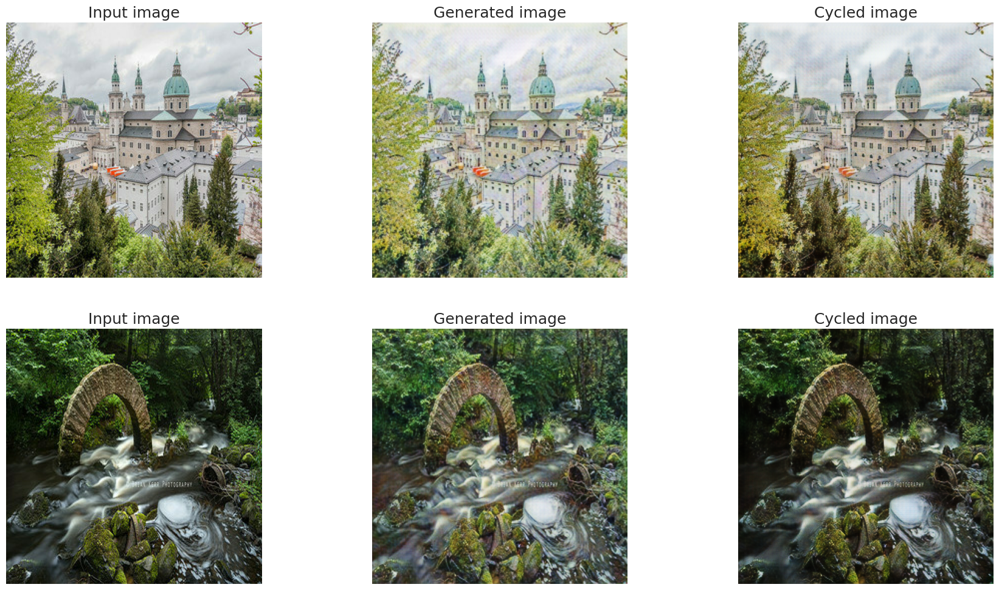

In [20]:
evaluate_cycle(photo_ds_eval.take(2), monet_generator, photo_generator, n_samples=2)

1/1 [==============================] - 0s 491ms/step


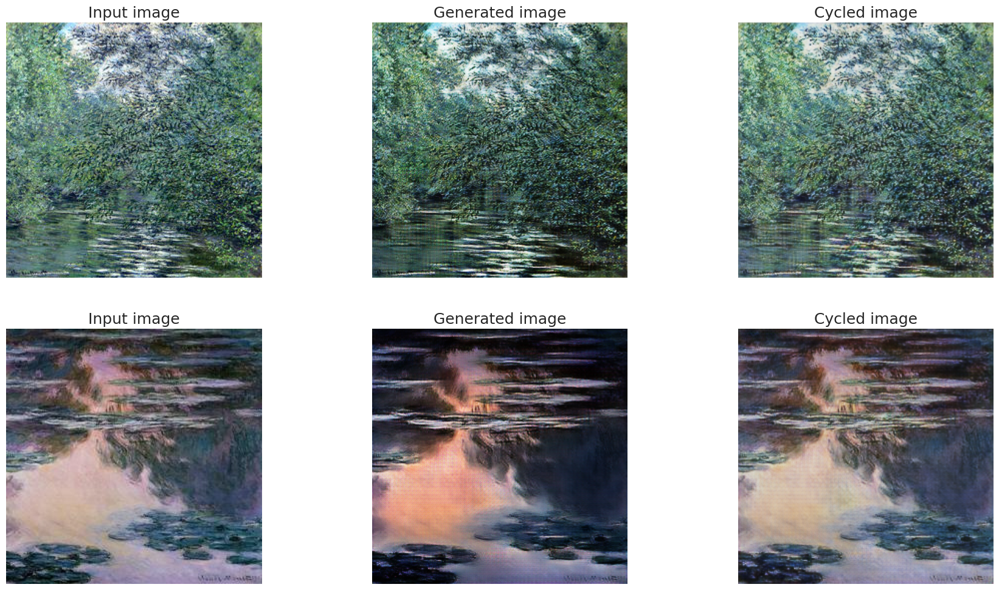

In [21]:
evaluate_cycle(monet_ds_eval.take(2), photo_generator, monet_generator, n_samples=2)

1/1 [==============================] - 0s 476ms/step


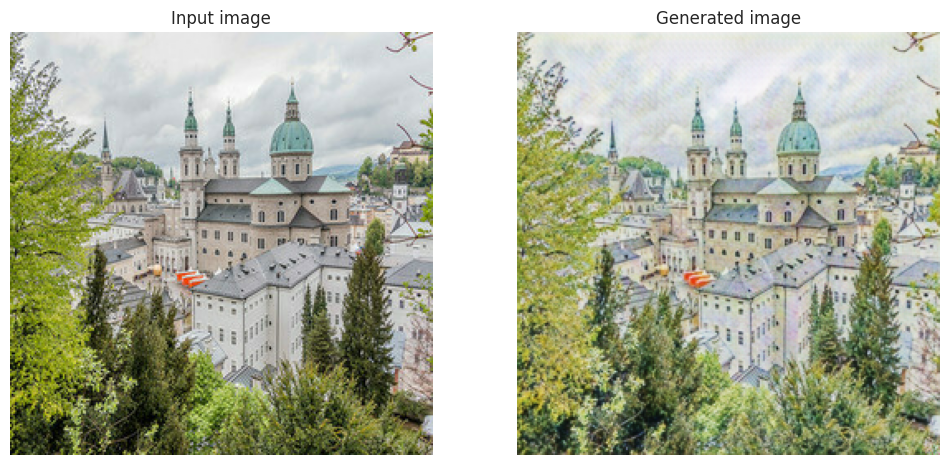

1/1 [==============================] - 0s 468ms/step


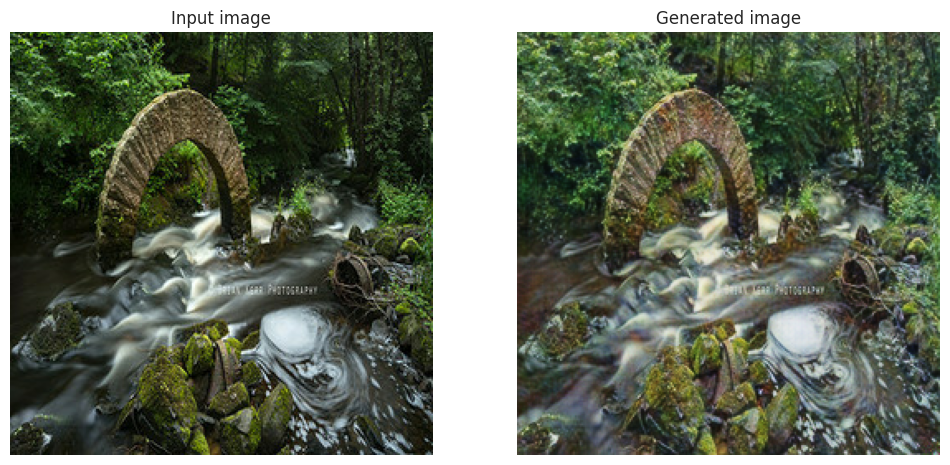

1/1 [==============================] - 0s 485ms/step


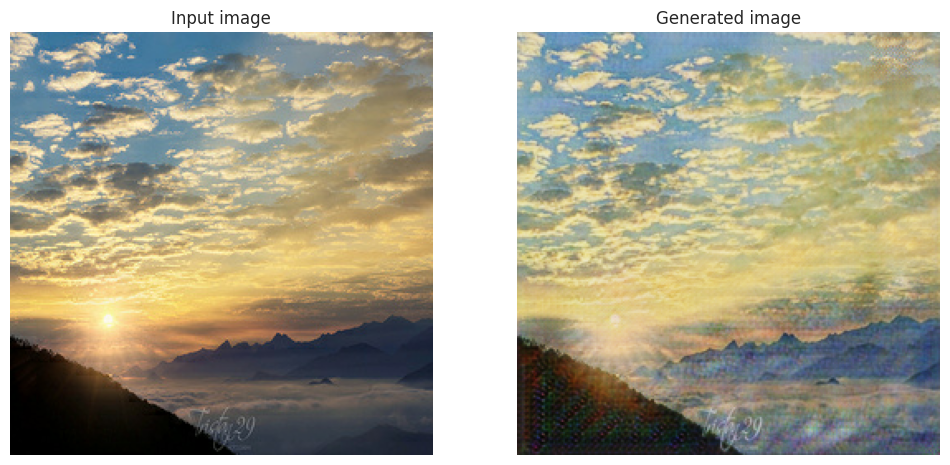

1/1 [==============================] - 0s 449ms/step


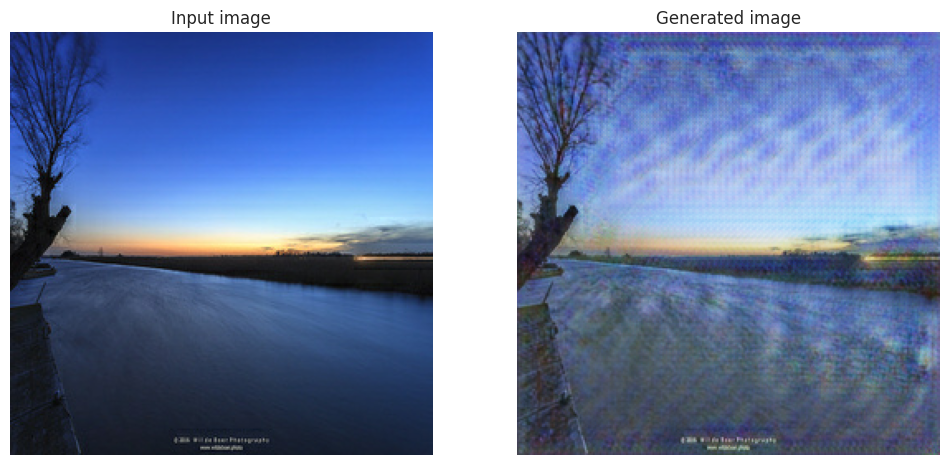

1/1 [==============================] - 0s 443ms/step


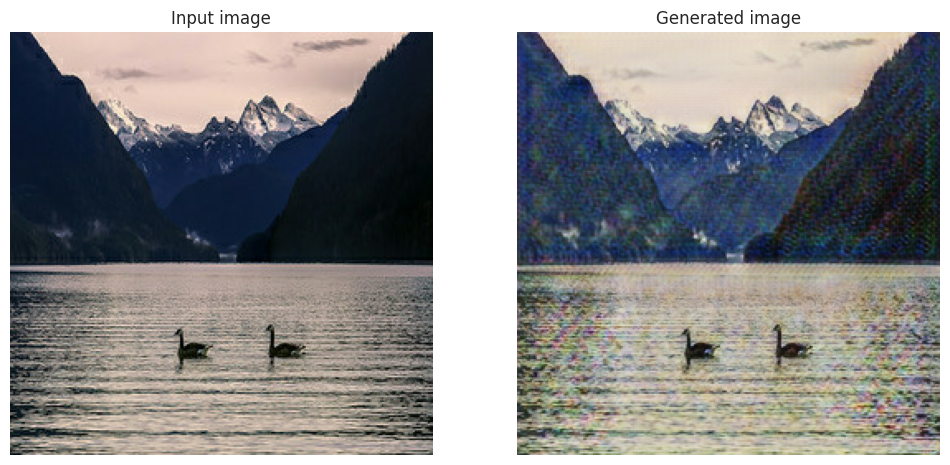

1/1 [==============================] - 0s 439ms/step


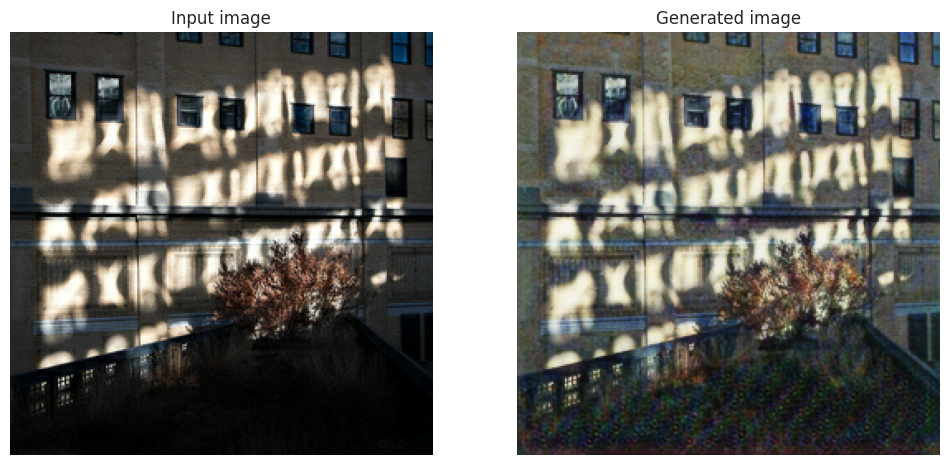

1/1 [==============================] - 0s 445ms/step


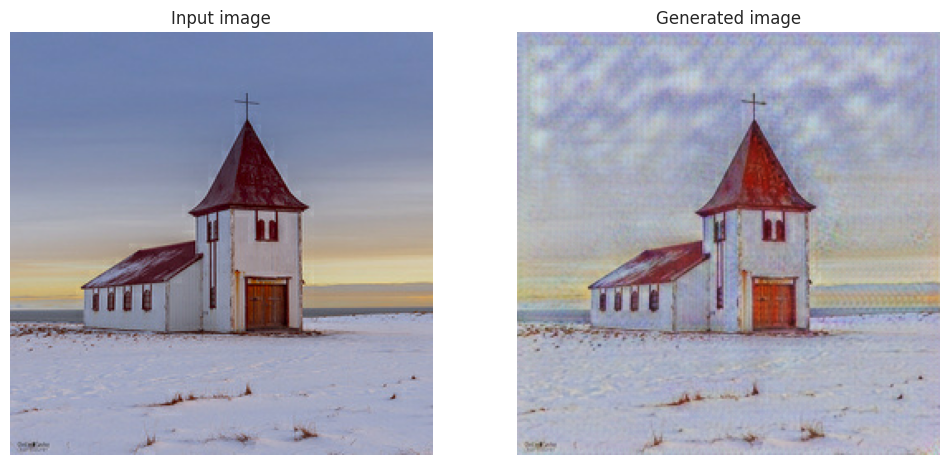

1/1 [==============================] - 0s 443ms/step


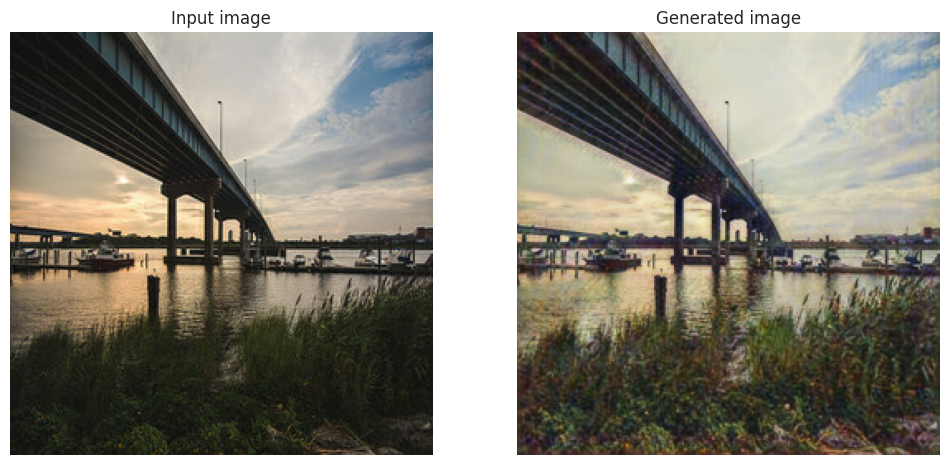

In [22]:
display_generated_samples(photo_ds_eval.take(8), monet_generator, 8)

In [27]:
os.makedirs('/content/images2/')
predict_and_save(photo_ds_eval, monet_generator, '/content/images2/')

saved image  1
saved image  2
saved image  3
saved image  4
saved image  5
saved image  6
saved image  7
saved image  8
saved image  9
saved image  10
saved image  11
saved image  12
saved image  13
saved image  14
saved image  15
saved image  16
saved image  17
saved image  18
saved image  19
saved image  20
saved image  21
saved image  22
saved image  23
saved image  24
saved image  25
saved image  26
saved image  27
saved image  28
saved image  29
saved image  30
saved image  31
saved image  32
saved image  33
saved image  34
saved image  35
saved image  36
saved image  37
saved image  38
saved image  39
saved image  40
saved image  41
saved image  42
saved image  43
saved image  44
saved image  45
saved image  46
saved image  47
saved image  48
saved image  49
saved image  50
saved image  51
saved image  52
saved image  53
saved image  54
saved image  55
saved image  56
saved image  57
saved image  58
saved image  59
saved image  60
saved image  61
saved image  62
saved image  63
s

KeyboardInterrupt: 

In [28]:
shutil.make_archive('/content/image2', 'zip', '/content/images2/')
print(f"Generated samples: {len([name for name in os.listdir('/content/images2/') if os.path.isfile(os.path.join('/content/images2/', name))])}")

Generated samples: 2549


In [24]:
monet_generator.save('monet_generator.h5')
photo_generator.save('photo_generator.h5')
monet_discriminator.save('monet_discriminator.h5')
photo_discriminator.save('photo_discriminator.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/usr/local/lib/python3.10/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


In [32]:
!cp /content/image2.zip /content/drive/MyDrive/genai_v8/image.zip
# !cp /content/monet_generator.h5 /content/drive/MyDrive/genai_v8/monet_generator.h5
# !cp /content/photo_generator.h5 /content/drive/MyDrive/genai_v8/photo_generator.h5
# !cp /content/monet_discriminator.h5 /content/drive/MyDrive/genai_v8/monet_discriminator.h5
# !cp /content/photo_discriminator.h5 /content/drive/MyDrive/genai_v8/photo_discriminator.h5

In [33]:
"""Calculates the Frechet Inception Distance (FID) to evalulate GANs

The FID metric calculates the distance between two distributions of images.
Typically, we have summary statistics (mean & covariance matrix) of one
of these distributions, while the 2nd distribution is given by a GAN.

When run as a stand-alone program, it compares the distribution of
images that are stored as PNG/JPEG at a specified location with a
distribution given by summary statistics (in pickle format).

The FID is calculated by assuming that X_1 and X_2 are the activations of
the pool_3 layer of the inception net for generated samples and real world
samples respectively.

See --help to see further details.

Code apapted from https://github.com/bioinf-jku/TTUR to use PyTorch instead
of Tensorflow

Copyright 2018 Institute of Bioinformatics, JKU Linz

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

   http://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
"""

import os
import pathlib
from argparse import ArgumentDefaultsHelpFormatter, ArgumentParser

import numpy as np
import torch
import torchvision.transforms as TF
from PIL import Image
from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d
import torchvision.transforms as transforms
import sys
try:
    from tqdm import tqdm
except ImportError:
    # If tqdm is not available, provide a mock version of it
    def tqdm(x):
        return x


# from inception import InceptionV3
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

try:
    from torchvision.models.utils import load_state_dict_from_url # type: ignore
except ImportError:
    from torch.utils.model_zoo import load_url as load_state_dict_from_url

# Inception weights ported to Pytorch from
# http://download.tensorflow.org/models/image/imagenet/inception-2015-12-05.tgz
FID_WEIGHTS_URL = "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth"  # noqa: E501


class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,  # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3,  # Final average pooling features
    }

    def __init__(
        self,
        output_blocks=(DEFAULT_BLOCK_INDEX,),
        resize_input=True,
        normalize_input=True,
        requires_grad=False,
        use_fid_inception=True,
    ):
        """Build pretrained InceptionV3

        Parameters
        ----------
        output_blocks : list of int
            Indices of blocks to return features of. Possible values are:
                - 0: corresponds to output of first max pooling
                - 1: corresponds to output of second max pooling
                - 2: corresponds to output which is fed to aux classifier
                - 3: corresponds to output of final average pooling
        resize_input : bool
            If true, bilinearly resizes input to width and height 299 before
            feeding input to model. As the network without fully connected
            layers is fully convolutional, it should be able to handle inputs
            of arbitrary size, so resizing might not be strictly needed
        normalize_input : bool
            If true, scales the input from range (0, 1) to the range the
            pretrained Inception network expects, namely (-1, 1)
        requires_grad : bool
            If true, parameters of the model require gradients. Possibly useful
            for finetuning the network
        use_fid_inception : bool
            If true, uses the pretrained Inception model used in Tensorflow's
            FID implementation. If false, uses the pretrained Inception model
            available in torchvision. The FID Inception model has different
            weights and a slightly different structure from torchvision's
            Inception model. If you want to compute FID scores, you are
            strongly advised to set this parameter to true to get comparable
            results.
        """
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, "Last possible output block index is 3"

        self.blocks = nn.ModuleList()

        if use_fid_inception:
            inception = fid_inception_v3()
        else:
            inception = _inception_v3(weights="DEFAULT")

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2),
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2),
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1)),
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps

        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)

        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x, size=(299, 299), mode="bilinear", align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp


def _inception_v3(*args, **kwargs):
    """Wraps `torchvision.models.inception_v3`"""
    try:
        version = tuple(map(int, torchvision.__version__.split(".")[:2]))
    except ValueError:
        # Just a caution against weird version strings
        version = (0,)

    # Skips default weight inititialization if supported by torchvision
    # version. See https://github.com/mseitzer/pytorch-fid/issues/28.
    if version >= (0, 6):
        kwargs["init_weights"] = False

    # Backwards compatibility: `weights` argument was handled by `pretrained`
    # argument prior to version 0.13.
    if version < (0, 13) and "weights" in kwargs:
        if kwargs["weights"] == "DEFAULT":
            kwargs["pretrained"] = True
        elif kwargs["weights"] is None:
            kwargs["pretrained"] = False
        else:
            raise ValueError(
                "weights=={} not supported in torchvision {}".format(
                    kwargs["weights"], torchvision.__version__
                )
            )
        del kwargs["weights"]

    return torchvision.models.inception_v3(*args, **kwargs)


def fid_inception_v3():
    """Build pretrained Inception model for FID computation

    The Inception model for FID computation uses a different set of weights
    and has a slightly different structure than torchvision's Inception.

    This method first constructs torchvision's Inception and then patches the
    necessary parts that are different in the FID Inception model.
    """
    inception = _inception_v3(num_classes=1008, aux_logits=False, weights=None)
    inception.Mixed_5b = FIDInceptionA(192, pool_features=32)
    inception.Mixed_5c = FIDInceptionA(256, pool_features=64)
    inception.Mixed_5d = FIDInceptionA(288, pool_features=64)
    inception.Mixed_6b = FIDInceptionC(768, channels_7x7=128)
    inception.Mixed_6c = FIDInceptionC(768, channels_7x7=160)
    inception.Mixed_6d = FIDInceptionC(768, channels_7x7=160)
    inception.Mixed_6e = FIDInceptionC(768, channels_7x7=192)
    inception.Mixed_7b = FIDInceptionE_1(1280)
    inception.Mixed_7c = FIDInceptionE_2(2048)

    state_dict = load_state_dict_from_url(FID_WEIGHTS_URL, progress=True)
    inception.load_state_dict(state_dict)
    return inception


class FIDInceptionA(torchvision.models.inception.InceptionA):
    """InceptionA block patched for FID computation"""

    def __init__(self, in_channels, pool_features):
        super(FIDInceptionA, self).__init__(in_channels, pool_features)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch5x5 = self.branch5x5_1(x)
        branch5x5 = self.branch5x5_2(branch5x5)

        branch3x3dbl = self.branch3x3dbl_1(x)
        branch3x3dbl = self.branch3x3dbl_2(branch3x3dbl)
        branch3x3dbl = self.branch3x3dbl_3(branch3x3dbl)

        # Patch: Tensorflow's average pool does not use the padded zero's in
        # its average calculation
        branch_pool = F.avg_pool2d(
            x, kernel_size=3, stride=1, padding=1, count_include_pad=False
        )
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch5x5, branch3x3dbl, branch_pool]
        return torch.cat(outputs, 1)


class FIDInceptionC(torchvision.models.inception.InceptionC):
    """InceptionC block patched for FID computation"""

    def __init__(self, in_channels, channels_7x7):
        super(FIDInceptionC, self).__init__(in_channels, channels_7x7)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch7x7 = self.branch7x7_1(x)
        branch7x7 = self.branch7x7_2(branch7x7)
        branch7x7 = self.branch7x7_3(branch7x7)

        branch7x7dbl = self.branch7x7dbl_1(x)
        branch7x7dbl = self.branch7x7dbl_2(branch7x7dbl)
        branch7x7dbl = self.branch7x7dbl_3(branch7x7dbl)
        branch7x7dbl = self.branch7x7dbl_4(branch7x7dbl)
        branch7x7dbl = self.branch7x7dbl_5(branch7x7dbl)

        # Patch: Tensorflow's average pool does not use the padded zero's in
        # its average calculation
        branch_pool = F.avg_pool2d(
            x, kernel_size=3, stride=1, padding=1, count_include_pad=False
        )
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch7x7, branch7x7dbl, branch_pool]
        return torch.cat(outputs, 1)


class FIDInceptionE_1(torchvision.models.inception.InceptionE):
    """First InceptionE block patched for FID computation"""

    def __init__(self, in_channels):
        super(FIDInceptionE_1, self).__init__(in_channels)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch3x3 = self.branch3x3_1(x)
        branch3x3 = [
            self.branch3x3_2a(branch3x3),
            self.branch3x3_2b(branch3x3),
        ]
        branch3x3 = torch.cat(branch3x3, 1)

        branch3x3dbl = self.branch3x3dbl_1(x)
        branch3x3dbl = self.branch3x3dbl_2(branch3x3dbl)
        branch3x3dbl = [
            self.branch3x3dbl_3a(branch3x3dbl),
            self.branch3x3dbl_3b(branch3x3dbl),
        ]
        branch3x3dbl = torch.cat(branch3x3dbl, 1)

        # Patch: Tensorflow's average pool does not use the padded zero's in
        # its average calculation
        branch_pool = F.avg_pool2d(
            x, kernel_size=3, stride=1, padding=1, count_include_pad=False
        )
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch3x3, branch3x3dbl, branch_pool]
        return torch.cat(outputs, 1)


class FIDInceptionE_2(torchvision.models.inception.InceptionE):
    """Second InceptionE block patched for FID computation"""

    def __init__(self, in_channels):
        super(FIDInceptionE_2, self).__init__(in_channels)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch3x3 = self.branch3x3_1(x)
        branch3x3 = [
            self.branch3x3_2a(branch3x3),
            self.branch3x3_2b(branch3x3),
        ]
        branch3x3 = torch.cat(branch3x3, 1)

        branch3x3dbl = self.branch3x3dbl_1(x)
        branch3x3dbl = self.branch3x3dbl_2(branch3x3dbl)
        branch3x3dbl = [
            self.branch3x3dbl_3a(branch3x3dbl),
            self.branch3x3dbl_3b(branch3x3dbl),
        ]
        branch3x3dbl = torch.cat(branch3x3dbl, 1)

        # Patch: The FID Inception model uses max pooling instead of average
        # pooling. This is likely an error in this specific Inception
        # implementation, as other Inception models use average pooling here
        # (which matches the description in the paper).
        branch_pool = F.max_pool2d(x, kernel_size=3, stride=1, padding=1)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch3x3, branch3x3dbl, branch_pool]
        return torch.cat(outputs, 1)


parser = ArgumentParser(formatter_class=ArgumentDefaultsHelpFormatter)
parser.add_argument("--batch-size", type=int, default=50, help="Batch size to use")
parser.add_argument(
    "--num-workers",
    type=int,
    help=(
        "Number of processes to use for data loading. " "Defaults to `min(8, num_cpus)`"
    ),
)
parser.add_argument(
    "--device", type=str, default=None, help="Device to use. Like cuda, cuda:0 or cpu"
)
parser.add_argument(
    "--dims",
    type=int,
    default=2048,
    choices=list(InceptionV3.BLOCK_INDEX_BY_DIM),
    help=(
        "Dimensionality of Inception features to use. "
        "By default, uses pool3 features"
    ),
)
parser.add_argument(
    "--save-stats",
    action="store_true",
    help=(
        "Generate an npz archive from a directory of "
        "samples. The first path is used as input and the "
        "second as output."
    ),
)
parser.add_argument(
    "path",
    type=str,
    nargs=2,
    help=("Paths to the generated images or " "to .npz statistic files"),
)

IMAGE_EXTENSIONS = {"bmp", "jpg", "jpeg", "pgm", "png", "ppm", "tif", "tiff", "webp"}


class ImagePathDataset(torch.utils.data.Dataset):
    def __init__(self, files, transforms=None):
        self.files = files
        self.transforms = transforms

    def __len__(self):
        return len(self.files)

    def __getitem__(self, i):
        path = self.files[i]
        img = Image.open(path).convert("RGB")
        if self.transforms is not None:
            img = self.transforms(img)
        return img


def get_activations2(
    files, model, batch_size=50, dims=2048, device="cpu", num_workers=1
):
    """Calculates the activations of the pool_3 layer for all images.

    Params:
    -- files       : List of image files paths
    -- model       : Instance of inception model
    -- batch_size  : Batch size of images for the model to process at once.
                     Make sure that the number of samples is a multiple of
                     the batch size, otherwise some samples are ignored. This
                     behavior is retained to match the original FID score
                     implementation.
    -- dims        : Dimensionality of features returned by Inception
    -- device      : Device to run calculations
    -- num_workers : Number of parallel dataloader workers

    Returns:
    -- A numpy array of dimension (num images, dims) that contains the
       activations of the given tensor when feeding inception with the
       query tensor.
    """
    model.eval()

    if batch_size > len(files):
        print(
            (
                "Warning: batch size is bigger than the data size. "
                "Setting batch size to data size"
            )
        )
        batch_size = len(files)

    dataset = ImagePathDataset(files, transforms=TF.ToTensor())
    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        drop_last=False,
        num_workers=num_workers,
    )

    pred_arr = np.empty((len(files), dims))

    start_idx = 0

    for batch in tqdm(dataloader):
        batch = batch.to(device)

        with torch.no_grad():
            pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
        if pred.size(2) != 1 or pred.size(3) != 1:
            pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

        pred = pred.squeeze(3).squeeze(2).cpu().numpy()

        pred_arr[start_idx : start_idx + pred.shape[0]] = pred

        start_idx = start_idx + pred.shape[0]

    return pred_arr

def get_activations(files, model, batch_size=50, dims=2048, device="cpu", num_workers=1):
    """Calculates the activations of the pool_3 layer for all images.

    Params:
    -- files       : List of image files paths
    -- model       : Instance of inception model
    -- batch_size  : Batch size of images for the model to process at once.
                     Make sure that the number of samples is a multiple of
                     the batch size, otherwise some samples are ignored. This
                     behavior is retained to match the original FID score
                     implementation.
    -- dims        : Dimensionality of features returned by Inception
    -- device      : Device to run calculations
    -- num_workers : Number of parallel dataloader workers

    Returns:
    -- A numpy array of dimension (num images, dims) that contains the
       activations of the given tensor when feeding inception with the
       query tensor.
    """
    model.eval()

    if batch_size > len(files):
        print(
            (
                "Warning: batch size is bigger than the data size. "
                "Setting batch size to data size"
            )
        )
        batch_size = len(files)

    # Add resize and tensor transform to ensure uniform image size
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize all images to 256x256
        transforms.ToTensor()           # Convert the resized image to a tensor
    ])

    dataset = ImagePathDataset(files, transforms=transform)
    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        drop_last=False,
        num_workers=num_workers,
    )

    pred_arr = np.empty((len(files), dims))

    start_idx = 0

    for batch in tqdm(dataloader):
        batch = batch.to(device)

        with torch.no_grad():
            pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
        if pred.size(2) != 1 or pred.size(3) != 1:
            pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

        pred = pred.squeeze(3).squeeze(2).cpu().numpy()

        pred_arr[start_idx : start_idx + pred.shape[0]] = pred

        start_idx = start_idx + pred.shape[0]

    return pred_arr

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).

    Stable version by Dougal J. Sutherland.

    Params:
    -- mu1   : Numpy array containing the activations of a layer of the
               inception net (like returned by the function 'get_predictions')
               for generated samples.
    -- mu2   : The sample mean over activations, precalculated on an
               representative data set.
    -- sigma1: The covariance matrix over activations for generated samples.
    -- sigma2: The covariance matrix over activations, precalculated on an
               representative data set.

    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert (
        mu1.shape == mu2.shape
    ), "Training and test mean vectors have different lengths"
    assert (
        sigma1.shape == sigma2.shape
    ), "Training and test covariances have different dimensions"

    diff = mu1 - mu2

    # Product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = (
            "fid calculation produces singular product; "
            "adding %s to diagonal of cov estimates"
        ) % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError("Imaginary component {}".format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean


def calculate_activation_statistics(
    files, model, batch_size=50, dims=2048, device="cpu", num_workers=1
):
    """Calculation of the statistics used by the FID.
    Params:
    -- files       : List of image files paths
    -- model       : Instance of inception model
    -- batch_size  : The images numpy array is split into batches with
                     batch size batch_size. A reasonable batch size
                     depends on the hardware.
    -- dims        : Dimensionality of features returned by Inception
    -- device      : Device to run calculations
    -- num_workers : Number of parallel dataloader workers

    Returns:
    -- mu    : The mean over samples of the activations of the pool_3 layer of
               the inception model.
    -- sigma : The covariance matrix of the activations of the pool_3 layer of
               the inception model.
    """
    print("in calculate_activation_statistics()")
    act = get_activations(files, model, batch_size, dims, device, num_workers)
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma


def compute_statistics_of_path(path, model, batch_size, dims, device, num_workers=1):
    print("in compute_statistics_of_path()")
    if path.endswith(".npz"):
        with np.load(path) as f:
            m, s = f["mu"][:], f["sigma"][:]
    else:
        path = pathlib.Path(path)
        files = sorted(
            [file for ext in IMAGE_EXTENSIONS for file in path.glob("*.{}".format(ext))]
        )
        m, s = calculate_activation_statistics(
            files, model, batch_size, dims, device, num_workers
        )

    return m, s


def calculate_fid_given_paths(paths, batch_size, device, dims, num_workers=1):
    """Calculates the FID of two paths"""
    print("in calculate_fid_given_paths()")
    for p in paths:
        if not os.path.exists(p):
            raise RuntimeError("Invalid path: %s" % p)

    block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]

    model = InceptionV3([block_idx]).to(device)

    m1, s1 = compute_statistics_of_path(
        paths[0], model, batch_size, dims, device, num_workers
    )
    m2, s2 = compute_statistics_of_path(
        paths[1], model, batch_size, dims, device, num_workers
    )
    fid_value = calculate_frechet_distance(m1, s1, m2, s2)

    return fid_value


def save_fid_stats(paths, batch_size, device, dims, num_workers=1):
    """Saves FID statistics of one path"""
    if not os.path.exists(paths[0]):
        raise RuntimeError("Invalid path: %s" % paths[0])

    if os.path.exists(paths[1]):
        raise RuntimeError("Existing output file: %s" % paths[1])

    block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]

    model = InceptionV3([block_idx]).to(device)

    print(f"Saving statistics for {paths[0]}")

    m1, s1 = compute_statistics_of_path(
        paths[0], model, batch_size, dims, device, num_workers
    )

    np.savez_compressed(paths[1], mu=m1, sigma=s1)


def main():
    # Hardcoded values for device, batch_size, dims, etc.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Hardcoded paths
    paths = ["/content/monet_jpg/", "/content/images2/"]  # Change to the paths you want to use
    batch_size = 100
    dims = 2048

    try:
        num_cpus = len(os.sched_getaffinity(0))
    except AttributeError:
        num_cpus = os.cpu_count()

    num_workers = min(num_cpus, 8) if num_cpus is not None else 0

    # Save statistics or calculate FID
    save_stats_flag = False  # Set to True if you want to save statistics instead of calculating FID

    print(paths, batch_size, device, dims, num_workers)
    if save_stats_flag:
        save_fid_stats(paths, batch_size, device, dims, num_workers)
    else:
        fid_value = calculate_fid_given_paths(paths, batch_size, device, dims, num_workers)
        print("FID: ", fid_value)

if __name__ == "__main__":
    main()


['/content/monet_jpg/', '/content/images2/'] 100 cpu 2048 8
in calculate_fid_given_paths()


Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 270MB/s]


in compute_statistics_of_path()
in calculate_activation_statistics()


100%|██████████| 3/3 [00:11<00:00,  3.88s/it]


in compute_statistics_of_path()
in calculate_activation_statistics()


100%|██████████| 26/26 [01:24<00:00,  3.24s/it]


FID:  91.97529990277397
